Подгрузка файлов

In [ ]:
!pip install navpy
!pip install tabulate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving map (1).txt to map (1).txt


Инициализация

In [ ]:
import re as reg
import numpy as np
import pandas as pd
from math import pi, sin, asin, cos, acos, radians, degrees, floor, sqrt, atan, atan2, hypot, copysign, fabs,tan
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import solve_ivp
from navpy import ecef2lla,lla2ecef

#Constants
LK = [55.62, 37.46] # lat, lon in deg
MU = 398600.4418 # km^3/s^2
secs = 86400  # s/day
R = 6378.135 # km
arcs = 3600*180/pi  # arcseconds per radian
J2 = 1.082e-3

def length(x,y,z):
  return sqrt(x**2+y**2+z**2)

def angl_vecs(vec1, vec2):
    tolerance = 0.00000001
    m1 = np.linalg.norm(vec1)
    m2 = np.linalg.norm(vec2)
    if m1*m2 > tolerance**2:
        temp = np.dot(vec1,vec2)/(m1*m2)
        if abs(temp) > 1.0:
            temp = np.sign(temp) * 1.0
        theta = acos(temp)
    else:
        theta = None
    return degrees(theta) 

#TLE data
TLE_data = ["1 33591U 09005A   22046.16222345  .00000100  00000-0  79198-4 0  9993",
            "2 33591  99.1639  77.6391 0014154 167.9533 192.1979 14.12530138671181"]
TLE_1 = np.array(TLE_data[0].split())
TLE_2 = np.array(TLE_data[1].split())

Кеплеровские орбитальные элементы

In [ ]:
inc = float(TLE_2[2]) 
RAAN = float(TLE_2[3]) 
e = float("0."+TLE_2[4]) 
arg_per = float(TLE_2[5]) 
m_a = float(TLE_2[6]) 
m_m = float(TLE_2[7]) 

#Convert to Keplerian elements
def semi_major_axis(m_m):
    # mean motion from revs/day to rad/s
	m_m = m_m * ((2*pi)/secs)
	return (MU/(m_m**2))**(1/3)

def e_anomaly(e, m_a):
	accuracy = 1e-4
	i = 0
	E = m_a
	E_next = E + e * sin(m_a) #Keplerian equatation solution
	while (abs((E_next - E)/E_next) > accuracy):
		E = E_next
		E_next = m_a + e * sin(m_a)
		i += 1
	return degrees(E)

def t_anomaly(e, e_a):
	return degrees(atan2(sqrt(1 - e**2) * sin(e_a), cos(e_a) - e))

year_epoch = int(TLE_1[3][:2]) #[year]
if year_epoch > 56:
	year_epoch+=1900
else:
	year_epoch+=2000

day_epoch = float(TLE_1[3][2:]) #[day]

epoch = datetime(year_epoch-1,12,31) + timedelta(day_epoch)

SMA = semi_major_axis(m_m)
p = SMA*(1-e**2)
e_a = e_anomaly(e, radians(m_a))
t_a = t_anomaly(e, radians(e_a))


def print_orb_el():
	print("Наклонение:",inc,'град.',"\nДолгота восходящего узла:",RAAN,'град.',"\nЭксцентриситет:",e)
	print("Аргумент перигея:",arg_per,'град.',"\nСредняя аномалия:",m_a,'град.',"\nЭкс. аномалия:", e_a,'град.',"\nИстинная аномалия:", t_a,'град.', "\nСреднее движение:",m_m,"об./день", "\nВысота апогея:", SMA,"км")
	print('Эпоха: ',epoch.strftime("%d %b %Y %H:%M:%S.%f")[:-3])
print_orb_el()

Наклонение: 99.1639 град. 
Долгота восходящего узла: 77.6391 град. 
Эксцентриситет: 0.0014154
Аргумент перигея: 167.9533 град. 
Средняя аномалия: 192.1979 град. 
Экс. аномалия: 192.1979 град. 
Истинная аномалия: -167.8192229489043 град. 
Среднее движение: 14.12530138671181 об./день 
Высота апогея: 7228.863529984768 км
Эпоха:  15 Feb 2022 03:53:36.106


Переход к вектору состояния

In [ ]:
def OE_to_ST(p,e,i,RAAN,omega, t_a):
  
    # State vector in inertial system(ECI)
    r_eci = np.array([(p * cos(t_a))/(1+e*cos(t_a)),(p * sin(t_a))/(1+e*cos(t_a)),0],dtype='float')
    v_eci = np.array([-sin(t_a)*(MU/p)**0.5,(e+cos(t_a))*(MU/p)**0.5,0],dtype='float')

    M = np.array([[cos(RAAN)*cos(omega) - sin(RAAN)*sin(omega)*cos(i),
              -cos(RAAN)*sin(omega) - sin(RAAN)*cos(omega)*cos(i),
              sin(RAAN)*sin(i)],
             [sin(RAAN)*cos(omega) + cos(RAAN)*sin(omega)*cos(i),
              -sin(RAAN)*sin(omega) + cos(RAAN)*cos(omega)*cos(i),
              -cos(RAAN)*sin(i)],
             [sin(omega)*sin(i),
              cos(omega)*sin(i),
              cos(i)]],dtype='float')
    r = np.dot(M,r_eci)
    v = np.dot(M,v_eci)

    return [r[0],r[1],r[2],v[0],v[1],v[2]]

ECI to ECEF

In [ ]:
#  ECI is J2000
#  ECEF is WGS84
#  ECI -> ECEF

def jul_date(day, month, year, hour, minute, sec):
    return 367 * year - int(7 * (year + int((month+9)/12)) / 4) + int(275 * month/9) +\
           day + 1721013.5 + ((sec/60 + minute)/60 + hour)/24

def JD_to_GMST(JD): 

  T_UT1 = (JD - 2451545) / 36525
  theta_GMST = 67310.54841 + (876600 * 60 * 60 + 8640184.812866) * T_UT1 + 0.093104 * T_UT1 ** 2 - 6.2e-6 * T_UT1 ** 3

  while theta_GMST > 86400:
      theta_GMST = theta_GMST - 86400

  theta_GMST = theta_GMST / 240 - 360

  return theta_GMST # in degress

def date_to_GMST(date): 
  JD = jul_date(date[0], date[1], date[2], date[3], date[4], date[5])
  theta_GMST = JD_to_GMST(JD)
  return theta_GMST

def earth_rotation_matrix(phi): # in radians
  return np.array([[cos(phi), sin(phi), 0],
                  [-sin(phi), cos(phi), 0],
                  [0, 0, 1]], dtype=np.float64)

def precession_matrix(jd_1, jd_2):

    T = (jd_1 - (51544.5 + 2400000.5))/36525
    dT = (jd_2 - jd_1)/36525

    # Precession angles
    zeta = -((2306.2181 + (1.39656 - 0.000139 * T) * T) +\
    ((0.30188 - 0.000344 * T) + 0.017998 * dT) * dT) * dT / arcs

    z = -zeta - ((0.79280 + 0.000411 * T) + 0.000205 * dT) * dT * dT / arcs

    theta = ((2004.3109 - (0.85330 + 0.000217 * T) * T) -\
    ((0.42665 + 0.000217 * T) + 0.041833 * dT) * dT) * dT / arcs

    # Rotation matrices
    zeta_matrix = np.array([[cos(zeta), sin(zeta), 0.0],
                  [-sin(zeta), cos(zeta), 0.0],
                  [0.0, 0.0, 1.0]])
    z_matrix = np.array([[cos(z), sin(z), 0.0],
                [-sin(z), cos(z), 0.0],
                [0.0, 0.0, 1.0]])
    theta_matrix = np.array([[cos(theta), 0.0, -sin(theta)],
                    [0.0, 1.0, 0.0],
                    [sin(theta), 0.0, cos(theta)]])

    return (zeta_matrix.dot(z_matrix)).dot(theta_matrix)

def eci_to_ecef(r_eci, date):#  ECI vectors
    GMST = radians(date_to_GMST(date)) % (2 * pi) # GMST must be in [0,2pi]
    Theta = earth_rotation_matrix(GMST)
    P = precession_matrix((51544.5 + 2400000.5), jul_date(date[0], date[1], date[2], date[3], date[4], date[5]))
    U = Theta.dot(P)
    r_ecef = U.dot(r_eci)
    return r_ecef

Интегрирование уравнений движения с J2

In [ ]:
prop_period = int(secs) # period of propagation in seconds


def rhs(s,r):
    return \
    [r[3],
     r[4],
     r[5],
     -MU * r[0] / (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 1.5 + \
     3 * MU * J2 * R ** 2 / (2 * (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 2.5) \
     * (5/(r[0]**2 + r[1]**2 + r[2]**2)-1)*r[0],
     -MU * r[1] / (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 1.5 + \
     3 * MU * J2 * R ** 2 / (2 * (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 2.5) \
     * (5/(r[0]**2 + r[1]**2 + r[2]**2)-1)*r[1],
     -MU * r[2] / (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 1.5 + \
     3 * MU * J2 * R ** 2 / (2 * (r[0] ** 2 + r[1] ** 2 + r[2] ** 2) ** 2.5) \
     * ((5/(r[0]**2 + r[1]**2 + r[2]**2)-1) * r[2]-2)]

init_data = OE_to_ST(p, e, inc, RAAN, arg_per, t_a)
print("Initialization completed")
res = solve_ivp(rhs, (0, prop_period), init_data, method = 'LSODA',min_step = 1,max_step = 1)
print(res.message)

#Convert ECI to ECEF
time_vec = []
r_vec_eci = []
r_vec_ecef = []

for i in range(0,prop_period):
  time =  epoch + timedelta(i/secs)
  r_eci = [res.y[0][i],res.y[1][i],res.y[2][i]]
  time_vec.append([time.day,time.month,time.year,time.hour,time.minute,time.second])  #day, month, year, hour, minute, sec
  r_vec_eci.append(r_eci)
  r_vec_ecef.append(eci_to_ecef(r_eci, [time.day,time.month,time.year,time.hour,time.minute,time.second]))


lat_data = []
lon_data = []

for i in range(0,prop_period):
    lat_i = ecef2lla(r_vec_ecef[i]*1000)[0]
    lon_i = ecef2lla(r_vec_ecef[i]*1000)[1]
    lat_data.append(lat_i)
    lon_data.append(lon_i)


Initialization completed
The solver successfully reached the end of the integration interval.


Расчет точек "захвата" спутником Лабораторного корпуса и карта неба

In [ ]:
cover_points = []

LK_vec = lla2ecef(LK[0],LK[1],172)/1000 # x,y,z in km

for j in range(0,prop_period):
  if abs(angl_vecs(LK_vec, r_vec_ecef[j] - LK_vec)) < 90.0:
    cover_points.append(j)

Ground track

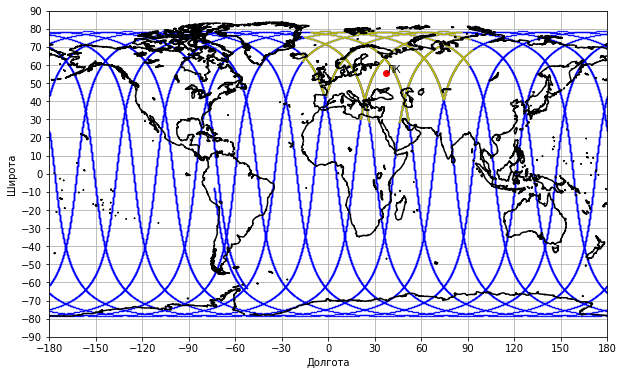

In [ ]:
def plot_map():
  map = np.loadtxt('map (1).txt',skiprows=1)
  fig = plt.figure(figsize = (10,6))
  ax = fig.gca()

  for i in range(0,len(lon_data)):
      plt.plot(lon_data[i],lat_data[i],'b.',markersize=0.5)
  for el in cover_points:
      plt.plot(lon_data[el],lat_data[el],'y.',markersize=0.5)  
  plt.plot(map[:,0],map[:,1],'black');
  ax.set_xlabel('Долгота')
  ax.set_ylabel('Широта')
  plt.xlim(-180,180)
  plt.ylim(-90,90)
  plt.yticks([-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90])
  plt.xticks([-180,-150,-120,-90,-60,-30,0,30,60,90,120,150,180])

  ax.grid(True)
  ax.text(LK[1], LK[0], 'ЛК')
  plt.scatter(LK[1],LK[0],c='red')
  plt.show()
plot_map()

Работа с расписанием

In [ ]:
from tabulate import tabulate 
import copy

def min_el(arr):
  mid_elev = []
  for j in range(0,len(arr)-2):
    mid_elev.append(abs(angl_vecs(LK_vec, r_vec_ecef[arr[j]] - LK_vec)))
  return round(min(mid_elev),2)

def shcedule_table(arr,st,fn):
  start_sec = int(st.split(':')[0])*60*60 + int(st.split(':')[1])*60
  final_sec = int(fn.split(':')[0])*60*60 + int(fn.split(':')[1])*60

  start = start_sec - (epoch.hour * 3600 + epoch.minute * 60 + epoch.second)
  #if final_sec > (epoch.hour * 3600 + epoch.minute * 60 + epoch.second):
  final = final_sec - (epoch.hour * 3600 + epoch.minute * 60 + epoch.second)
  el=[]
  schedule = []
  
  for j in range(0,len(arr)):
    if arr[j]>=start and arr[j] <=final:
      if (arr[j]-arr[j-1]) != 1:
        if len(el) > 1:
          schedule.append(el)
        el = [arr[j]]
      else:
        el.append(arr[j])
  if len(el) > 1:
          schedule.append(el)
  
  table_traj = copy.deepcopy(schedule)

  for ind in schedule:    
    ind.append(ind[0]+len(ind))
    ind.append(len(ind))
    ind.append(min_el(ind))
    del ind[1:len(ind)-3]
    ind[0] = (epoch + timedelta(ind[0]/secs)).strftime(" %H:%M:%S")
    ind[1] = (epoch + timedelta(ind[1]/secs)).strftime(" %H:%M:%S")
  return [schedule,table_traj]

print(tabulate(shcedule_table(cover_points,'13:00','24:00')[0], headers=["Начало","Окончание","Продолжительность, секунд","Средняя элевация, град."]))

Начало    Окончание      Продолжительность, секунд    Средняя элевация, град.
--------  -----------  ---------------------------  -------------------------
13:28:54  13:39:10                             617                      83.59
15:15:08  15:25:44                             637                      83.03
16:58:59  17:13:05                             847                      71.35
18:42:07  18:58:10                             964                      22.62
20:25:23  20:40:03                             881                      63.18
22:10:19  22:17:10                             412                      87.24


Sky track

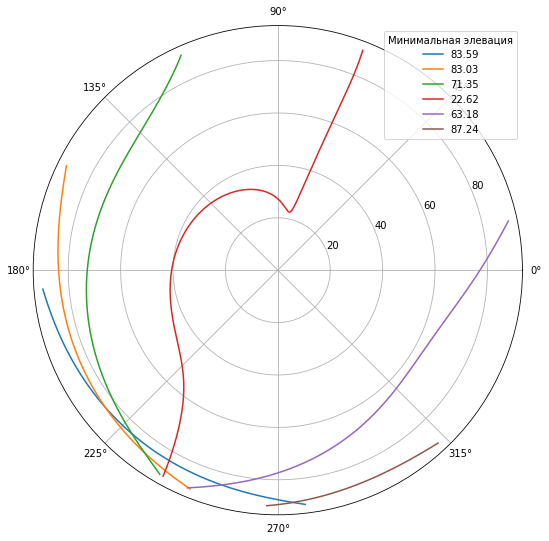

In [ ]:
def polar_plot():
  fig = plt.figure(figsize =(9, 9))
  plt.axes(projection = 'polar')
  elem = shcedule_table(cover_points,'13:00','24:00')[1]
  for j in range(0,len(elem)):
    elev_vec = []
    az_vec = []
    for k in range(0,len(elem[j])):
      sat_vec = r_vec_ecef[elem[j][k]] - LK_vec
      elev_vec.append(angl_vecs(LK_vec, r_vec_ecef[elem[j][k]] - LK_vec))
      az_vec.append(atan2(sat_vec[1],sat_vec[0]))
    plt.polar(az_vec,elev_vec,label = shcedule_table(cover_points,'13:00','24:00')[0][j][3])
  plt.legend(title = 'Минимальная элевация',loc = 'upper right')
  plt.show()

polar_plot()

Построение в 3D

In [ ]:
def Plot3D():
  import datetime
  from plotly import __version__
  %matplotlib inline

  import plotly.offline as pyo
  import plotly.graph_objs as go
  from plotly.offline import iplot

  import cufflinks as cf
  from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 


  cf.go_offline()

  init_notebook_mode(connected=False)

  def configure_plotly_browser_state():
    import IPython
    display(IPython.core.display.HTML('''
          <script src="/static/components/requirejs/require.js"></script>
          <script>
            requirejs.config({
              paths: {
                base: '/static/base',
                plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
              },
            });
          </script>
          '''))
  import plotly.graph_objects as go

  configure_plotly_browser_state()

  u, v = np.mgrid[0:2*np.pi:20j, 0:np.pi:10j]
  x = R*np.cos(u)*np.sin(v)
  y = R*np.sin(u)*np.sin(v)
  z = R*np.cos(v)

  fig = go.Figure(data = [go.Surface(x=x, y=y, z=z), 
                          go.Scatter3d(x=res.y[0], y=res.y[1], z=res.y[2], mode = 'lines', line=dict(width=5,color='black'))])

  fig.show()
Plot3D()